 # ORB Detector Parameter Tuning 
## Setup the required functions and input images

In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Fri Feb  1 20:06:06 2019

@author: vik748
"""
import numpy as np
import cv2
import sys
from matplotlib import pyplot as plt
from ssc import *
%matplotlib inline


def draw_keypoints(vis_orig, keypoints, color = (0, 255, 255), thick = 3):
    vis = vis_orig.copy()
    for kp in keypoints:
        x, y = kp.pt
        cv2.circle(vis, (int(x), int(y)), int(vis.shape[1]/200), color, thickness=thick)
    return vis

def draw_markers(vis_orig, keypoints, color = (0, 0, 255)):
    vis = vis_orig.copy()
    for kp in keypoints:
        x, y = kp.pt
        cv2.drawMarker(vis, (int(x), int(y)), color,  markerSize=30, markerType = cv2.MARKER_CROSS, thickness=3)
    return vis

def draw_marker_pts(vis_orig, pts, color = (0, 0, 255)):
    vis = vis_orig.copy()
    for row in pts[:,0,:]:
        cv2.drawMarker(vis, (int(row[0]), int(row[1])), color,  markerSize=30, markerType = cv2.MARKER_CROSS, thickness=3)
    return vis

if sys.platform == 'darwin':
    path = '/Users/vik748/Google Drive/'
else:
    path = '/home/vik748/'
img = cv2.imread(path+'data/chess_board2/GOPR1498.JPG',1) # iscolor = CV_LOAD_IMAGE_GRAYSCALE

mask_pts_1498 = np.array([[1030, 740], [1820, 840], [1785, 1085], [1675, 1400], [975, 1285]])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# create a mask image filled with 1s, the size of original image
mask = np.ones(img.shape[:2], dtype=np.uint8)
mask = cv2.fillConvexPoly(mask, mask_pts_1498, color=[0, 0, 0])


## Default settings on low res image

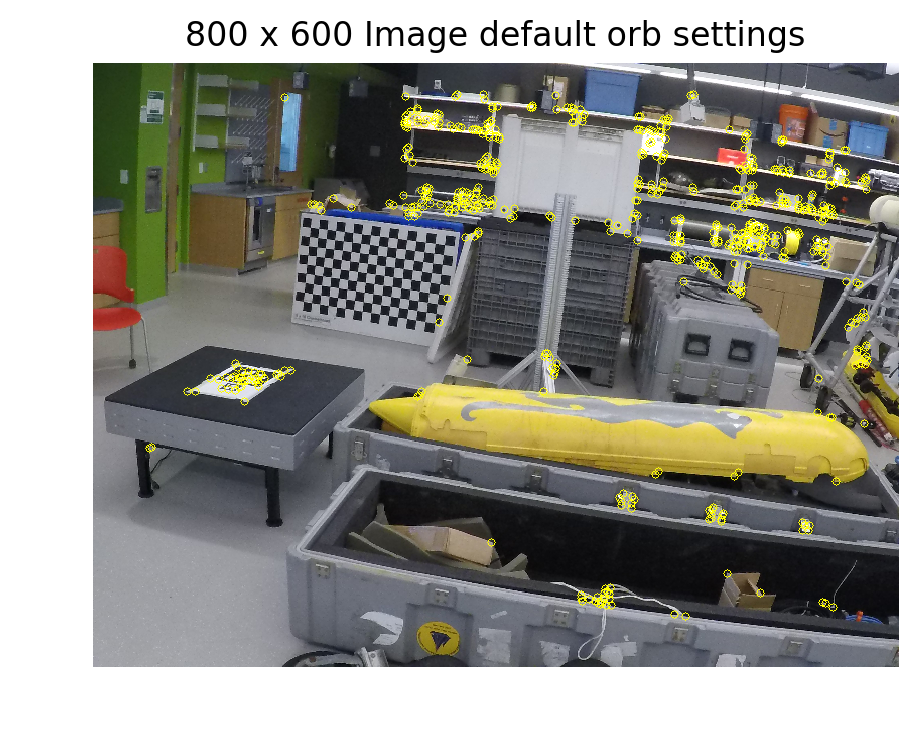

In [2]:
img_lowres = cv2.resize(img,None,fx=1/5, fy=1/5, interpolation = cv2.INTER_CUBIC)
gray_lowres = cv2.resize(gray,None,fx=1/5, fy=1/5, interpolation = cv2.INTER_CUBIC)
mask_lowres = cv2.resize(mask,None,fx=1/5, fy=1/5, interpolation = cv2.INTER_CUBIC)

detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(gray_lowres,mask_lowres)

img_out = draw_keypoints(img_lowres,kp1, thick=1)

#fig2 = plt.figure(2, dpi=200.0)
fig, ax= plt.subplots(dpi=200)
plt.title('800 x 600 Image default orb settings')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
plt.show()


## Default Settings on High Res Image

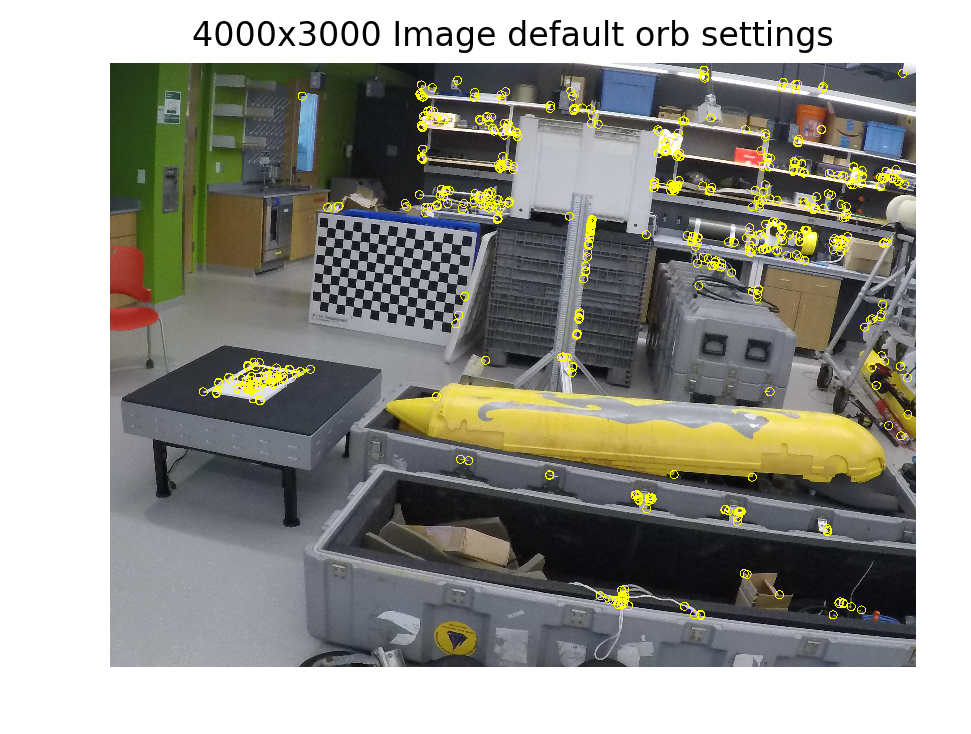

In [3]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(gray,mask)

img_out = draw_keypoints(img,kp1, thick=3)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Image default orb settings')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
plt.show()


## Changing the patchSize

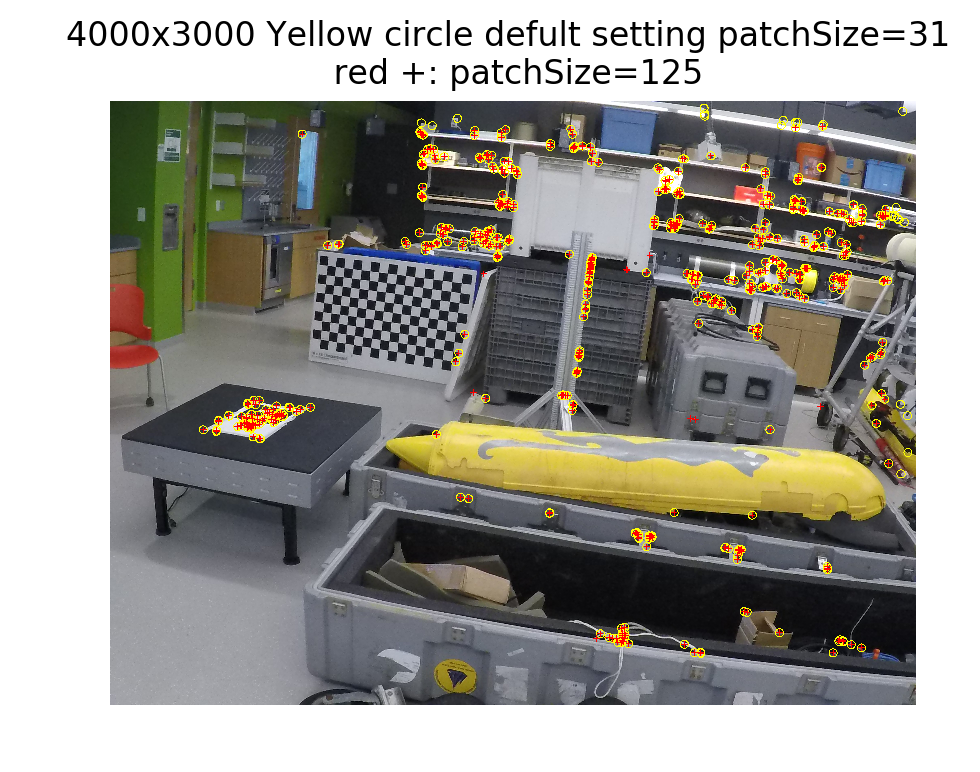

In [4]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=125, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=125, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting patchSize=31 \n red +: patchSize=125')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

## Changing the firstLevel

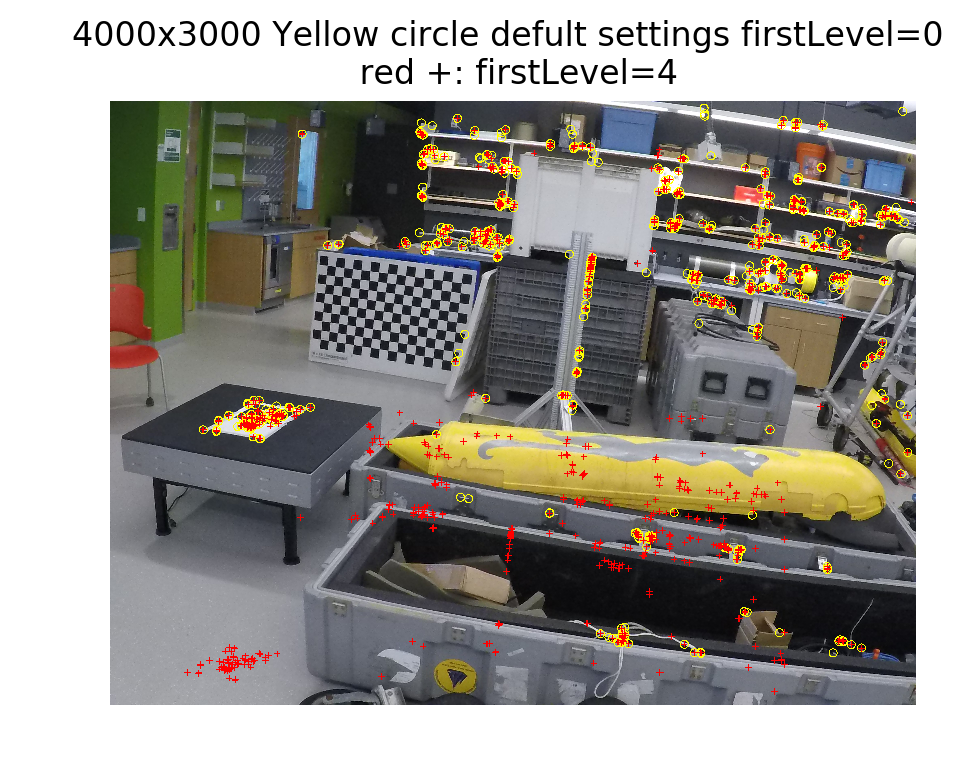

In [5]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=4, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult settings firstLevel=0 \n red +: firstLevel=4')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

## Changing the scaleFactor

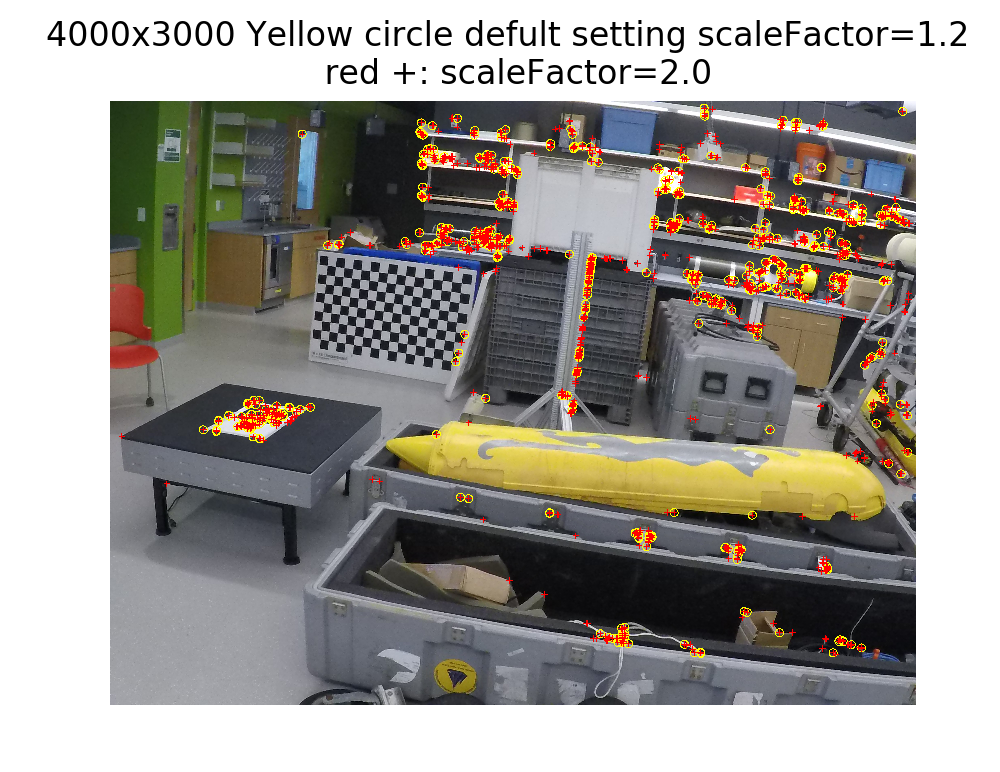

In [6]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=2500, scaleFactor=2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting scaleFactor=1.2 \n red +: scaleFactor=2.0')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

## Changing the nLevels

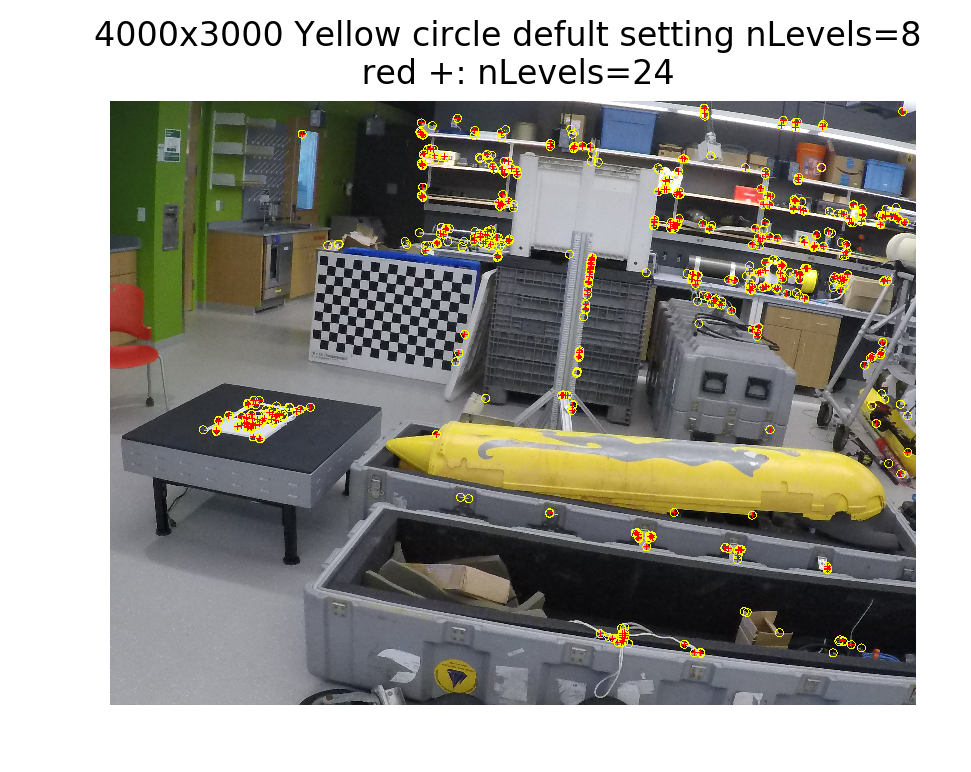

In [7]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=24, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting nLevels=8 \n red +: nLevels=24')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

## Changing the fastThreshold

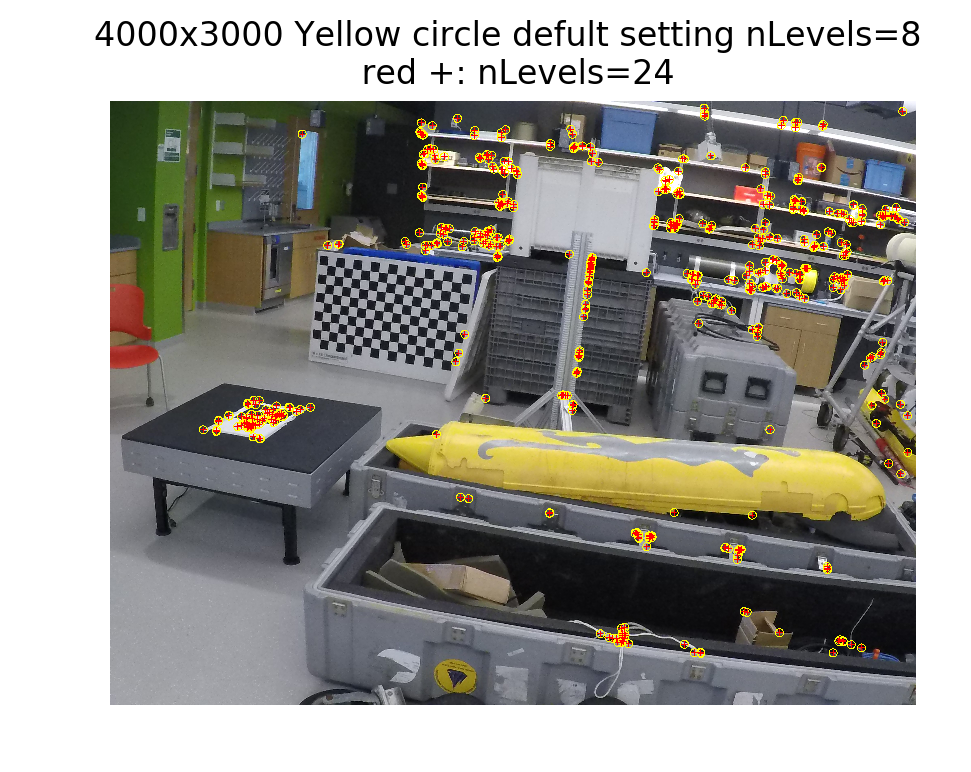

In [8]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=4, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=10)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting nLevels=8 \n red +: nLevels=24')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

## Tweaked Parameters

22502
22502


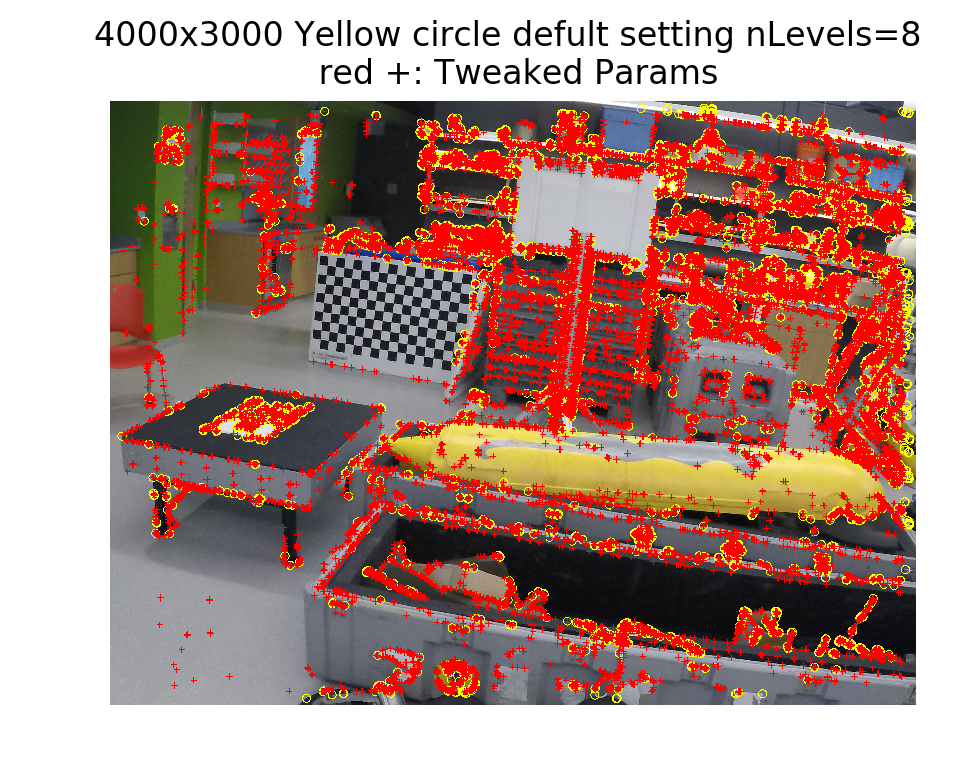

In [14]:
detector1 = cv2.ORB_create(25000, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=25000, edgeThreshold=65, patchSize=65, nlevels=4, 
                     fastThreshold=10, scaleFactor=10.0, WTA_K=4,
                     scoreType=cv2.ORB_HARRIS_SCORE, firstLevel=0)
# find the keypoints and descriptors with ORB
kp1 = detector1.detect(img,mask)
kp2 = detector2.detect(img,mask)
print (len(kp2))
#kp2 = radial_non_max(kp2,25)
print (len(kp2))

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting nLevels=8 \n red +: Tweaked Params')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

# Tweaked Parameters + SSC

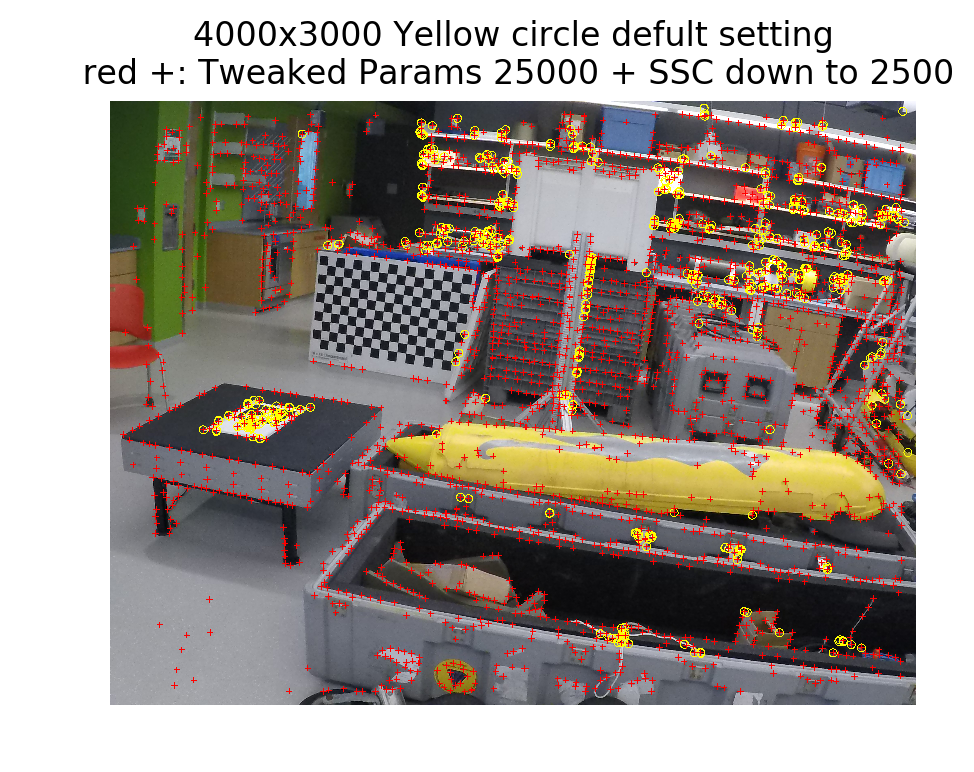

In [10]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=25000, edgeThreshold=65, patchSize=65, nlevels=4, 
                     fastThreshold=10, scaleFactor=4.0, WTA_K=4,
                     scoreType=cv2.ORB_HARRIS_SCORE, firstLevel=0)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(gray,mask)
kp2 = detector2.detect(gray,mask)

#kp1 = sorted(kp1, key = lambda x:x.response, reverse = True)
kp2 = sorted(kp2, key = lambda x:x.response, reverse = True)

#kp1 = SSC(kp1, 2500, 0.1, gray.shape[1], gray.shape[0])
kp2 = SSC(kp2, 2500, 0.1, gray.shape[1], gray.shape[0])

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting\n red +: Tweaked Params 25000 + SSC down to 2500')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

# Tweaked params and Radial Non Max Supression

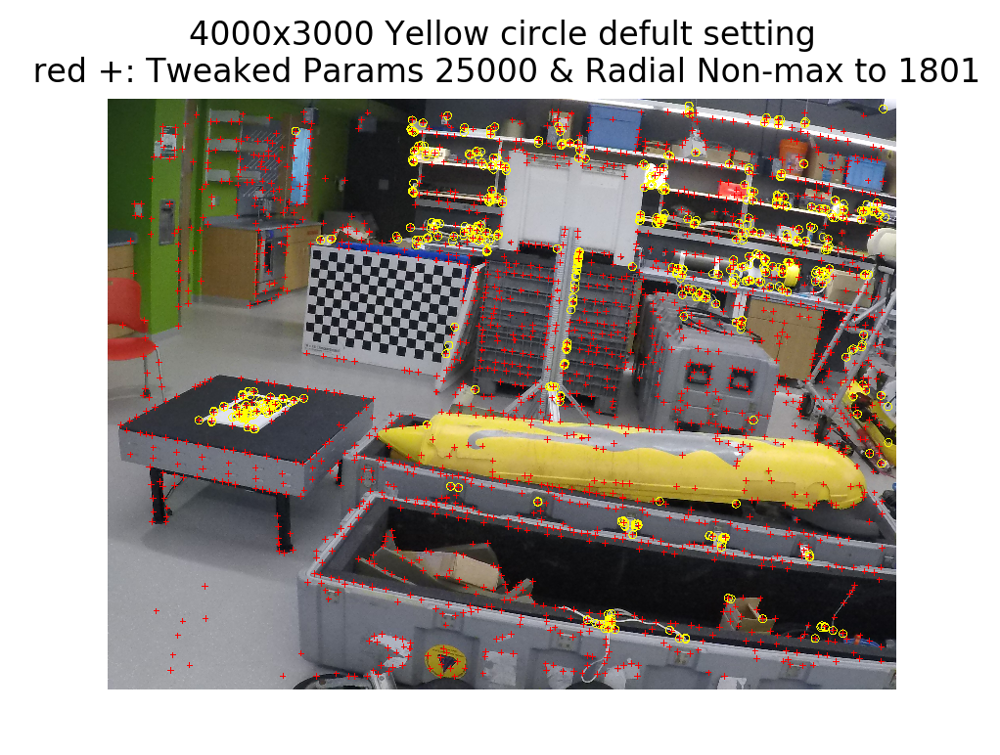

1801

In [11]:
from scipy import spatial
def radial_non_max(kp_list, dist):
    kp = np.array(kp_list)
    kp_mask = np.ones(len(kp), dtype=bool)
    pts = [k.pt for k in kp]
    tree = spatial.cKDTree(pts)
    #print ("len of kp1:",len(kp))
    for i, k in enumerate(kp):
        if kp_mask[i]:
            pt = tree.data[i]
            idx = tree.query_ball_point(tree.data[i], dist, p=2., eps=0, n_jobs=1)
            resp = [kp[ii].response for ii in idx]
            _, maxi = max([(v,i) for i,v in enumerate(resp)])
            del idx[maxi]
            for kp_i in idx:
                kp_mask[kp_i] = False
    return kp[kp_mask].tolist()

detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)

detector2 = cv2.ORB_create(nfeatures=25000, edgeThreshold=65, patchSize=65, nlevels=4, 
                     fastThreshold=10, scaleFactor=4.0, WTA_K=4,
                     scoreType=cv2.ORB_HARRIS_SCORE, firstLevel=0)

# find the keypoints and descriptors with ORB
kp1 = detector1.detect(gray,mask)
kp2 = detector2.detect(gray,mask)

kp2 = radial_non_max(kp2, 25)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_markers(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle defult setting\n red +: Tweaked Params 25000 & Radial Non-max to '+str(len(kp2)))
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()

len(kp2)

## Good Features To Track Detector

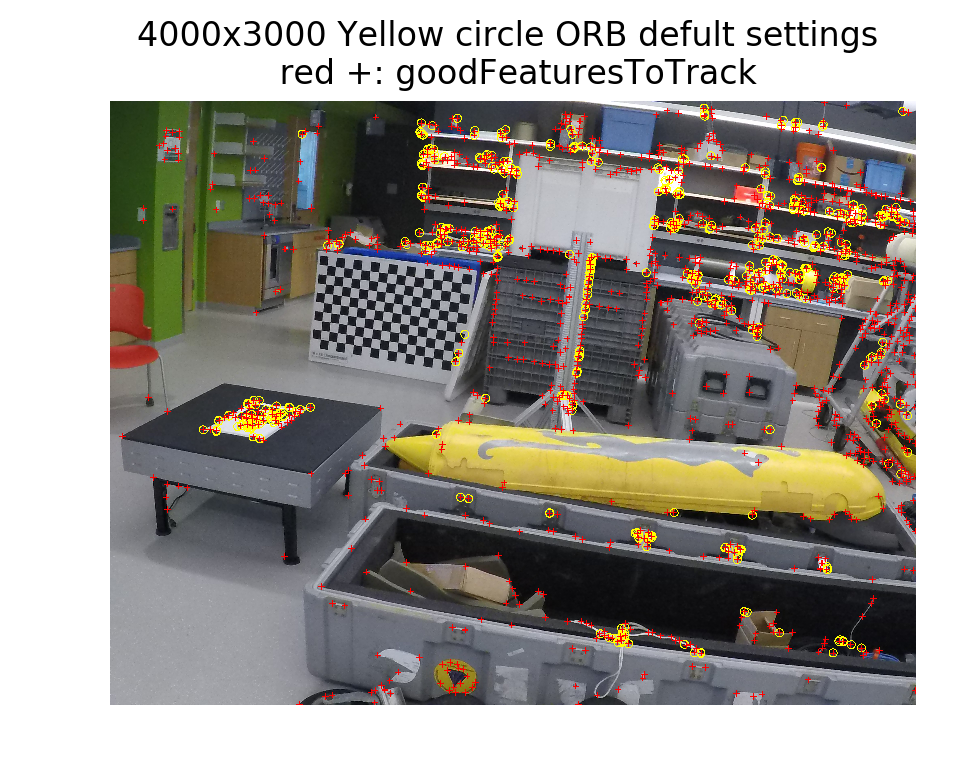

In [12]:
detector1 = cv2.ORB_create(nfeatures=2500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, 
                           firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE,  
                           patchSize=31, fastThreshold=20)


# find the keypoints and descriptors with ORB
kp1 = detector1.detect(gray,mask)
#kp2 = detector2.detect(img,mask) gradientSize[
kp2 = cv2.goodFeaturesToTrack(gray, 2500, qualityLevel=0.05, mask= mask, minDistance=20, blockSize = 9, useHarrisDetector = False,k =0.04)

img_out1 = draw_keypoints(img,kp1)
img_out2 = draw_marker_pts(img_out1,kp2)

fig, ax= plt.subplots(dpi=200)
plt.title('4000x3000 Yellow circle ORB defult settings \n red +: goodFeaturesToTrack')
plt.axis("off")
plt.imshow(cv2.cvtColor(img_out2, cv2.COLOR_BGR2RGB))
plt.show()